# Wstęp do multimediów
### Kacper Górski, 331379

In [85]:
from matplotlib import pyplot as plt
from IPython.display import display, Markdown
import cv2
import numpy as np
import copy

In [86]:
NUM_IMAGES = 36
STUDENT_INDEX = 331379

def image_to_process(student_index, num_images):
    return student_index % num_images

print("Image index to process: ", image_to_process(STUDENT_INDEX, NUM_IMAGES))

IMAGE_PATH = ".\\color\\susie_col.png"
IMAGE_PATH_INOISE1 = ".\\color_inoise1\\susie_col_inoise.png"
IMAGE_PATH_INOISE2 = ".\\color_inoise2\\susie_col_inoise.png"
IMAGE_PATH_NOISE = ".\\color_noise\\susie_col_noise.png"

Image index to process:  35


image, wymiary: (480, 720, 3), typ danych: uint8, wartości: 12 - 255


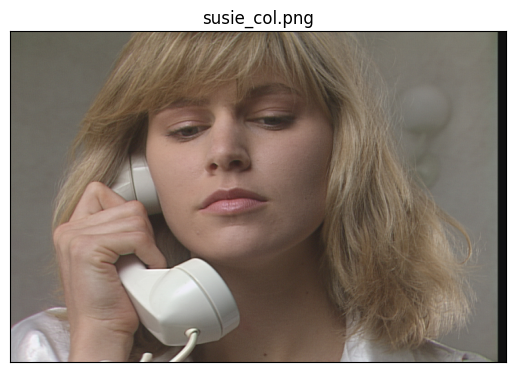

In [87]:
def load_image(path):
    image = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def plt_imshow(img, img_title="image"):
    plt.figure()
    plt.title(img_title)
    plt.imshow(img)
    plt.xticks([]), plt.yticks([])
    plt.show()

image = load_image(IMAGE_PATH)
print(f"image, wymiary: {image.shape}, typ danych: {image.dtype}, wartości: {image.min()} - {image.max()}")
plt_imshow(image, img_title=IMAGE_PATH.split("\\").pop())

# Zadanie 1

Zrealizować operację filtracji barwnego obrazu cyfrowego.   
Do realizacji zadania wykorzystać obrazy zaszumione (szumem gaussowskim oraz impulsowym).  
Każdy z obrazów wejściowych poddać przetwarzaniu filtrem wygładzającym (Gaussa) i filtrem 
medianowym. Każdy obraz wynikowy wyświetlić i obliczyć dla niego PSNR (w stosunku do obrazu 
oryginalnego, nie zaszumionego!, funkcja do obliczania PSNR dostępna jest w przykładowym 
skrypcie). Ocenić działanie filtrów dla masek o rozmiarach: 3x3, 5x5, 7x7.  
Zebrać w tabeli PSNR dla różnych rodzajów szumów, filtrów i rozmiarów maski.  
1 
Jaki wpływ na skuteczność filtracji i na zniekształcenie obrazu ma rozmiar maski filtru?   
Czy ocena subiektywna uzyskanych obrazów wynikowych, jest zgodna z PSNR (lepsza jakość – 
większy PSNR)?   
Opisać wnioski w sprawozdaniu. 

In [88]:
MASK_SIZE_3X3 = 3
MASK_SIZE_5X5 = 5
MASK_SIZE_7X7 = 7

def add_gaussian_noise(img, mean = 0, std = 25):
    noise = np.random.normal(mean, std, img.shape).astype(np.int16)
    noisy_img = np.clip(img.astype(np.int16) + noise, 0, 255).astype(np.uint8)
    return noisy_img

def add_impulse_noise(img):
    return img

def apply_gaussian_filter(img, size):
    return cv2.GaussianBlur(img, (size, size), 0)

def apply_median_filter(img, size):
    return cv2.medianBlur(img, size)

def calc_psnr(img1, img2):
    imax = 255.**2
    mse = ((img1.astype(np.float64)-img2)**2).sum()/img1.size
    return 10.0*np.log10(imax/mse)

psnrs_collected = dict()

def apply_filtration(img, noisy_img, filter_name, filter: callable):
    for size in MASK_SIZE_3X3, MASK_SIZE_5X5, MASK_SIZE_7X7:
        filtered_image = filter(noisy_img, size)
        psnr = calc_psnr(img, filtered_image)
        filter_title = f'{filter_name} {size}x{size}'

        psnrs_collected[filter_title] = psnr

        plt_imshow(filtered_image, f"{filter_title} (PSNR: {psnr} dB)")
        cv2.imwrite(f"{filter_name.split(" ")[0].capitalize()}{size}x{size}.png", filtered_image)






## Obraz zaszumiony szumem gaussowskim

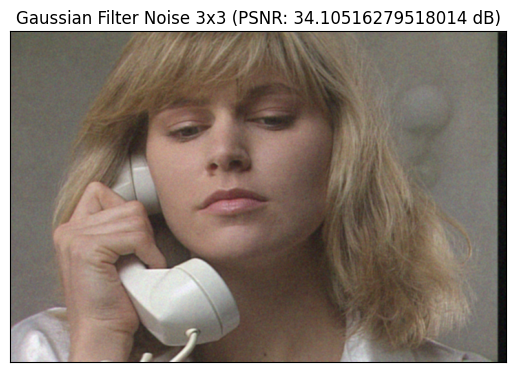

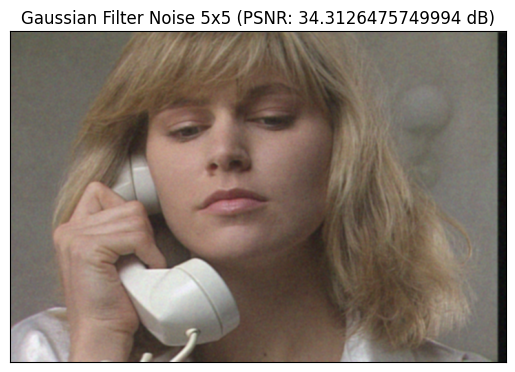

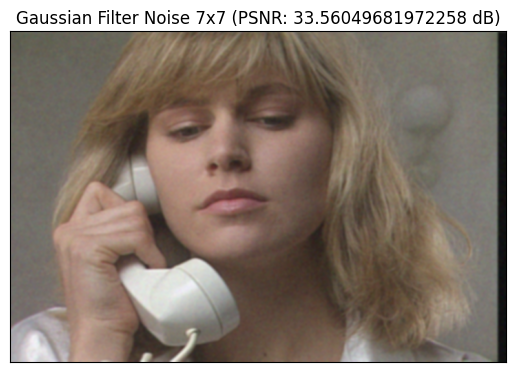

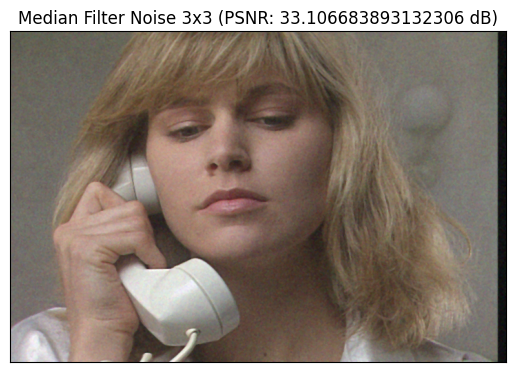

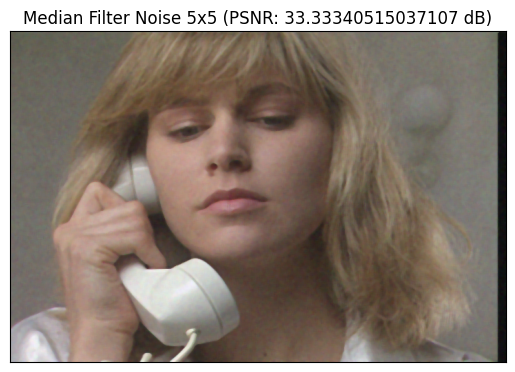

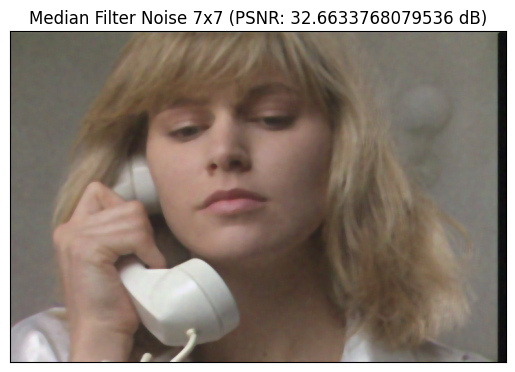

In [89]:
noisy_image = load_image(IMAGE_PATH_NOISE)

apply_filtration(image, noisy_image, "Gaussian Filter Noise", apply_gaussian_filter)

apply_filtration(image, noisy_image, "Median Filter Noise", apply_median_filter)


## Obraz zaszumiony szumem impulsowym 1

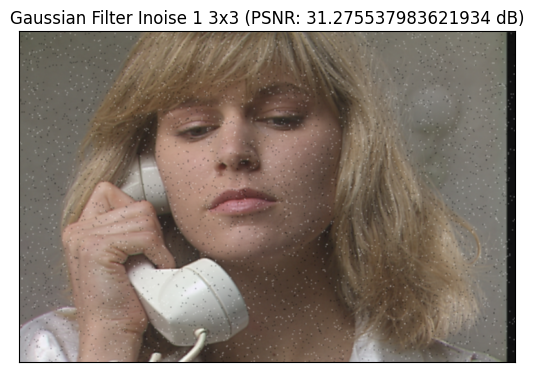

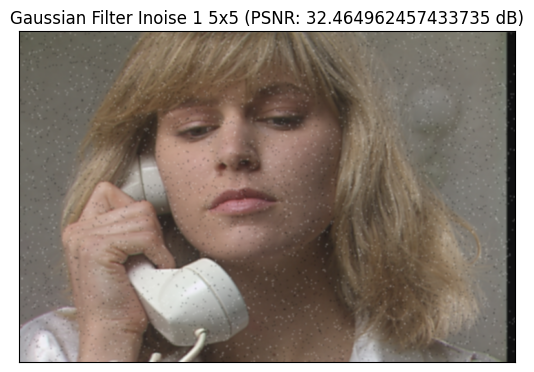

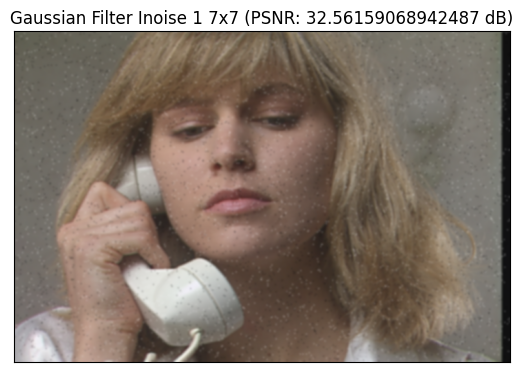

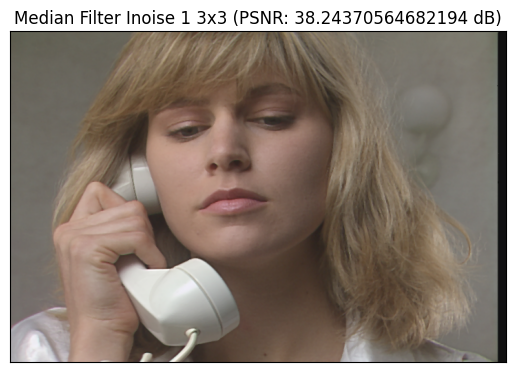

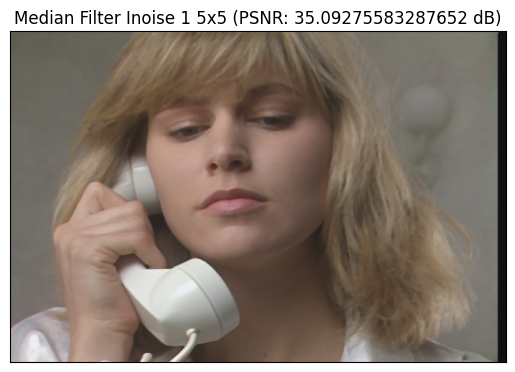

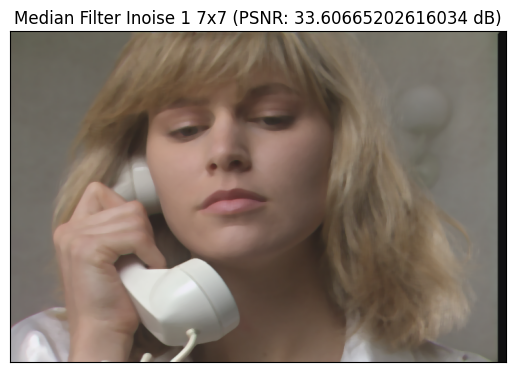

In [90]:
inoise_image_1 = load_image(IMAGE_PATH_INOISE1)

apply_filtration(image, inoise_image_1, "Gaussian Filter Inoise 1", apply_gaussian_filter)

apply_filtration(image, inoise_image_1, "Median Filter Inoise 1", apply_median_filter)

## Obraz zaszumiony szumem impulsowym 2

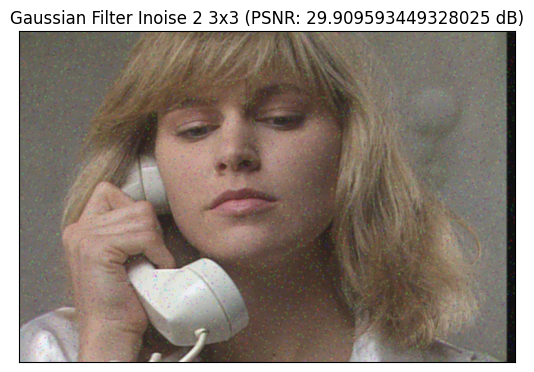

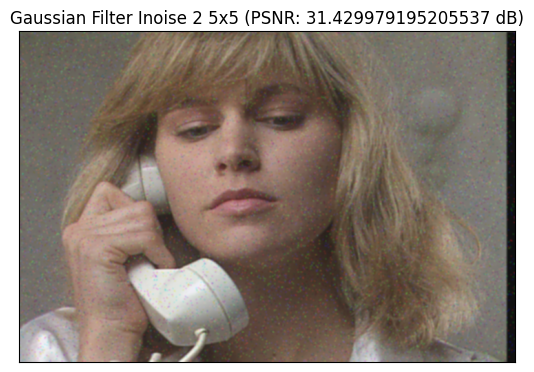

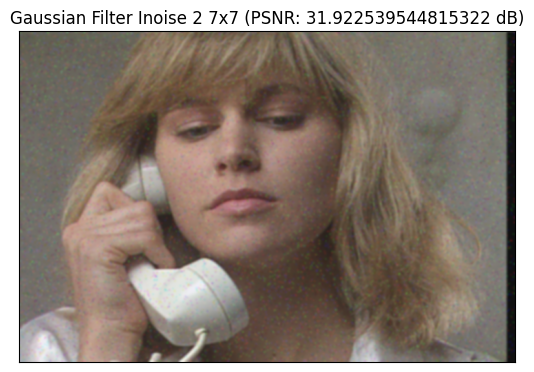

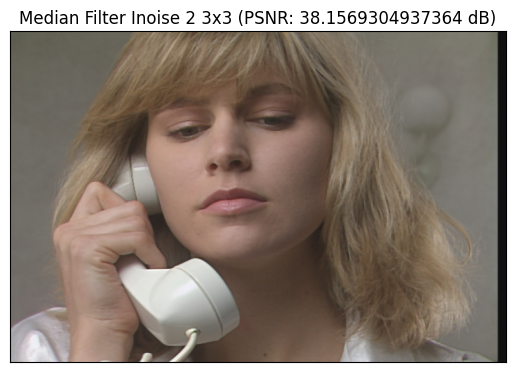

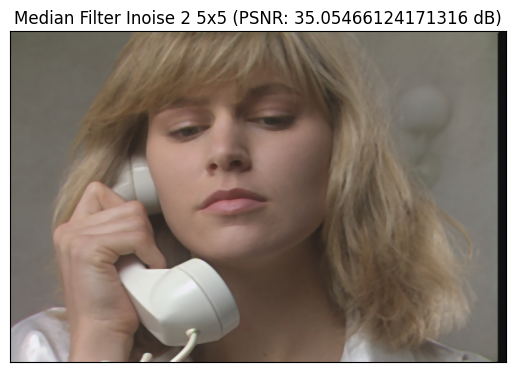

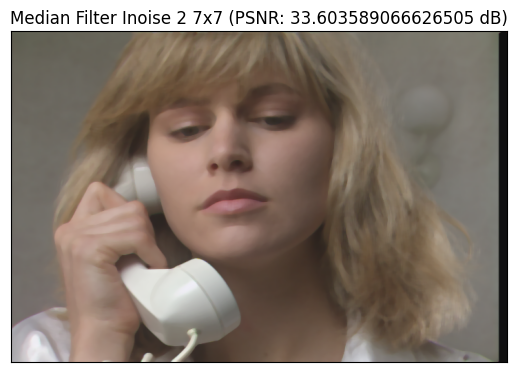

In [91]:
inoise_image_2 = load_image(IMAGE_PATH_INOISE2)

apply_filtration(image, inoise_image_2, "Gaussian Filter Inoise 2", apply_gaussian_filter)

apply_filtration(image, inoise_image_2, "Median Filter Inoise 2", apply_median_filter)

## Bez filtrów

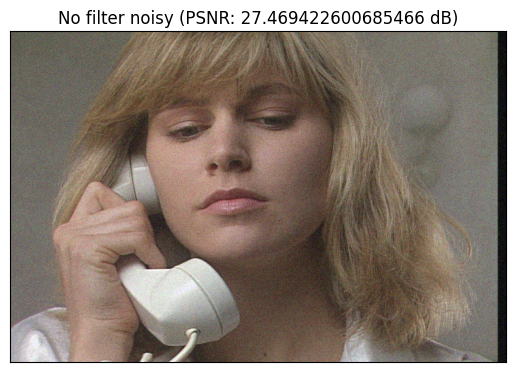

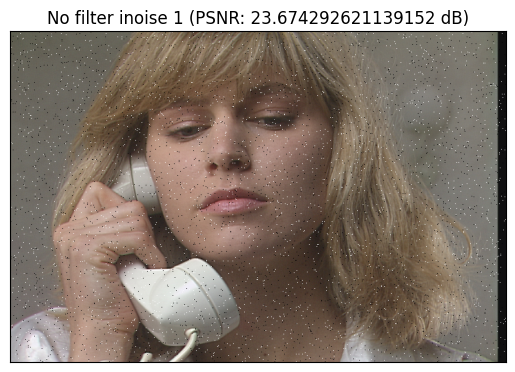

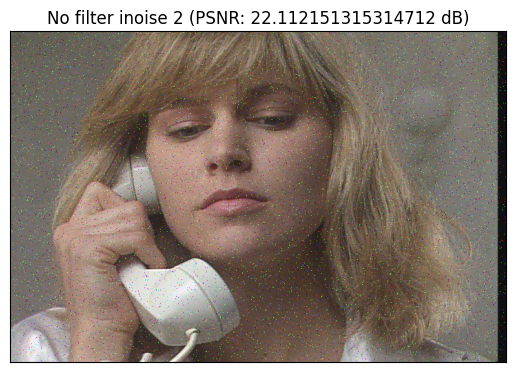

In [92]:
def no_filtration_psnr(img, noisy_img, operation_name):
    psnr = calc_psnr(img, noisy_img)
    psnrs_collected[operation_name] = psnr
    plt_imshow(noisy_img, f"{operation_name} (PSNR: {psnr} dB)")

no_filtration_psnr(image, noisy_image, 'No filter noisy')
no_filtration_psnr(image, inoise_image_1, 'No filter inoise 1')
no_filtration_psnr(image, inoise_image_2, 'No filter inoise 2')

In [93]:
markdown_table = f"""
### Brak Filtrów

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| -   | {psnrs_collected['No filter noisy']}  | {psnrs_collected['No filter inoise 1']}  | {psnrs_collected['No filter inoise 2']}  |

### Filtr Gaussa

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | {psnrs_collected['Gaussian Filter Noise 3x3']}  | {psnrs_collected['Gaussian Filter Inoise 1 3x3']}  | {psnrs_collected['Gaussian Filter Inoise 2 3x3']}  |
| 5x5 | {psnrs_collected['Gaussian Filter Noise 5x5']}  | {psnrs_collected['Gaussian Filter Inoise 1 5x5']}  | {psnrs_collected['Gaussian Filter Inoise 2 5x5']}  |
| 7x7 | {psnrs_collected['Gaussian Filter Noise 7x7']}  | {psnrs_collected['Gaussian Filter Inoise 1 7x7']}  | {psnrs_collected['Gaussian Filter Inoise 2 7x7']}  |

### Filtr Medianowy

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | {psnrs_collected['Median Filter Noise 3x3']}  | {psnrs_collected['Median Filter Inoise 1 3x3']}  | {psnrs_collected['Median Filter Inoise 2 3x3']}  |
| 5x5 | {psnrs_collected['Median Filter Noise 5x5']}  | {psnrs_collected['Median Filter Inoise 1 5x5']}  | {psnrs_collected['Median Filter Inoise 2 5x5']}  |
| 7x7 | {psnrs_collected['Median Filter Noise 7x7']}  | {psnrs_collected['Median Filter Inoise 1 7x7']}  | {psnrs_collected['Median Filter Inoise 2 7x7']}  |
"""

display(Markdown(markdown_table))


### Brak Filtrów

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| -   | 27.469422600685466  | 23.674292621139152  | 22.112151315314712  |

### Filtr Gaussa

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | 34.10516279518014  | 31.275537983621934  | 29.909593449328025  |
| 5x5 | 34.3126475749994  | 32.464962457433735  | 31.429979195205537  |
| 7x7 | 33.56049681972258  | 32.56159068942487  | 31.922539544815322  |

### Filtr Medianowy

|     | noise              | inoise_1           | inoise_2           |
|-----|--------------------|--------------------|--------------------|
| 3x3 | 33.106683893132306  | 38.24370564682194  | 38.1569304937364  |
| 5x5 | 33.33340515037107  | 35.09275583287652  | 35.05466124171316  |
| 7x7 | 32.6633768079536  | 33.60665202616034  | 33.603589066626505  |


# Zadanie 2

Zrealizować operację wyrównania histogramu dla obrazu barwnego i zapisać obraz wynikowy do 
pliku. UWAGA: operację wyrównania histogramu należy wykonać wyłącznie dla składowej 
odpowiadającej za jasność, w tym celu należy wejściowy obraz RGB skonwertować do innej 
przestrzeni (np. YCbCr/YUV), a po wyrównaniu histogramu dla właściwej składowej powrócić do 
pierwotnego formatu.   
Porównać uzyskane obrazy i ich histogramy (w szczególności: histogram dla składowej, dla której 
wykonano operację wyrównywania histogramu).   
Czy obraz po wyrównaniu histogramu jest subiektywnie lepszej jakości? 

In [94]:
def create_ycrcb_image(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

def split_components(img):
    ycrcb_image = create_ycrcb_image(img)
    return cv2.split(ycrcb_image)       # y, cr, cb

def merge_with_aligned_luminosity(components):
    y, cr, cb = components
    return cv2.merge([y, cr, cb])

def equalize_ycrcb_image(img):
    components = split_components(img)
    y, cr, cb = components

    y_equalized = cv2.equalizeHist(y)
    return merge_with_aligned_luminosity((y_equalized, cr, cb))

def equalize_image(img):
    ycrcb_equalized = equalize_ycrcb_image(img)
    return cv2.cvtColor(ycrcb_equalized, cv2.COLOR_YCrCb2BGR)

def print_histogram(image):
    hist_cv = cv2.calcHist([image], [0], None, [256], [0, 256])
    hist_cv = hist_cv.flatten()
    plt.figure()
    plt.plot(hist_cv, color="blue")
    plt.xlim([0,256])

### Obraz po wyrównaniu histogramu dla składowej iluminacji
### Porównanie histogramów przed i po wyrównaniu składowej luminancji (dla zdjęć w przestrzeni BGR)

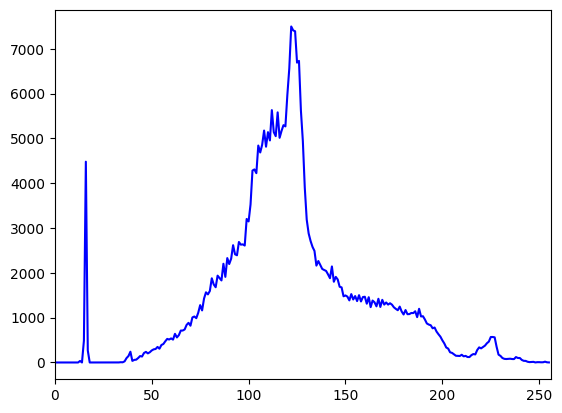

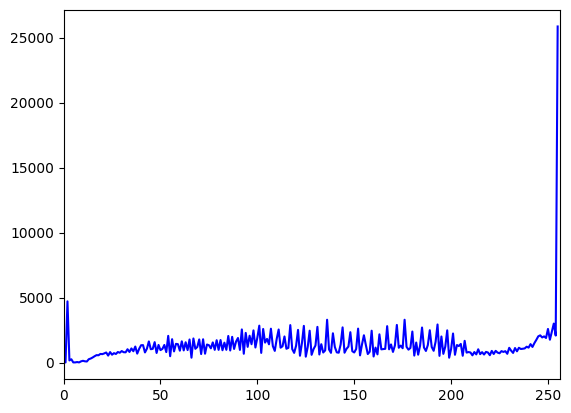

In [95]:
equalized_image = equalize_image(image)
print_histogram(image)
print_histogram(equalized_image)

### Porównanie histogramów przed i po wyrównaniu składowej luminancji  (dla zdjęć w przestrzeni YCrCb)

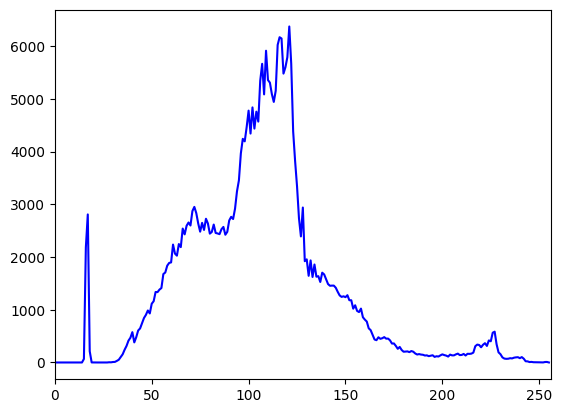

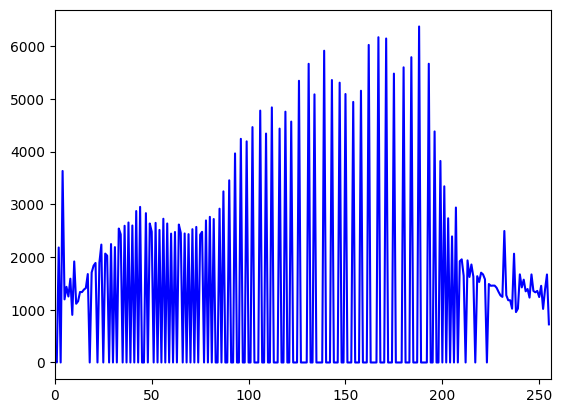

In [96]:
ycrcb_image = create_ycrcb_image(image)
equalized_ycrcb_image = equalize_ycrcb_image(image)

print_histogram(ycrcb_image)
print_histogram(equalized_ycrcb_image)

# Zadanie 3

Korzystając z filtru Laplace’a do wyznaczenia wysokoczęstotliwościowych składowych obrazu 
dokonać wyostrzenia obrazu:  
``img_out = img_in + W*img_laplace.``   
Jaki jest wpływ wagi składowej wysokoczęstotliwościowej na postać obrazu wynikowego?   
Dla jakich wartości tej wagi uzyskuje się dobre, przyjemne dla oka wyniki?   
Uwaga: należy pamiętać, że wyostrzanie obrazu powoduje również uwydatnienie szumu w obrazie, w 
niektórych przypadkach (niezbyt dobrej jakości obrazów oryginalnych) przydatne może być wstępne 
wygładzenie obrazu filtrem dolnoprzepustowym (np. filtrem Gaussa).  
Wskazówka: wykorzystać funkcję cv2.addWeighted() do sumowania obrazów i równoczesnej 
konwersji wyniku do 8-bitowych liczb całkowitych z przedziału [0, 255].   
Uwaga: ze względu na sposób wyliczania laplasjanu w bibliotece OpenCV w celu uzyskania 
‘dobrych’ wyników należy odjąć ‘obraz wysokoczęstotliwościowy’, czyli zastosować ujemne 
wartości wagi W. 

In [ ]:
def laplace_filter(img):
    return cv2.Laplacian(img, cv2.CV_64F)

def sharpen_image(img, weights, smoothen_image: bool = False):
    process_image = copy.deepcopy(img)
    if smoothen_image: process_image = cv2.GaussianBlur(img, (3, 3), 0)

    img_laplace = laplace_filter(process_image)
    img_laplace = cv2.convertScaleAbs(img_laplace)

    img_out = cv2.addWeighted(img, 1.0, img_laplace, weights, 0)
    img_out = np.clip(img_out, 0, 255).astype(np.uint8)

    return img_out

### Obraz wyostrzony z wagami 0, 0.1, 0.3, 0.5, 1

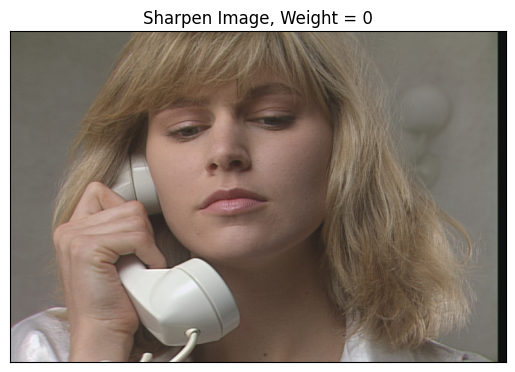

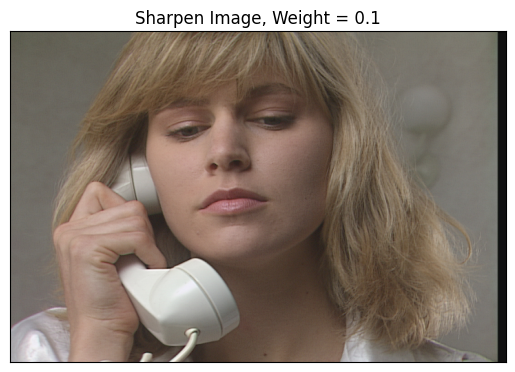

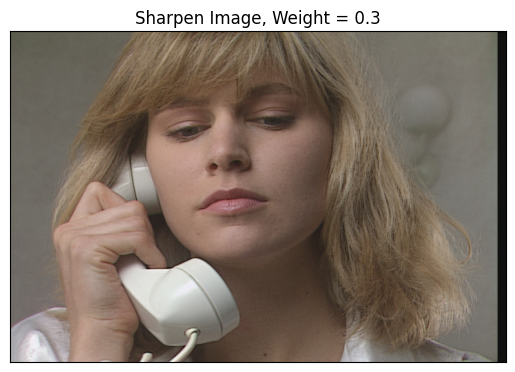

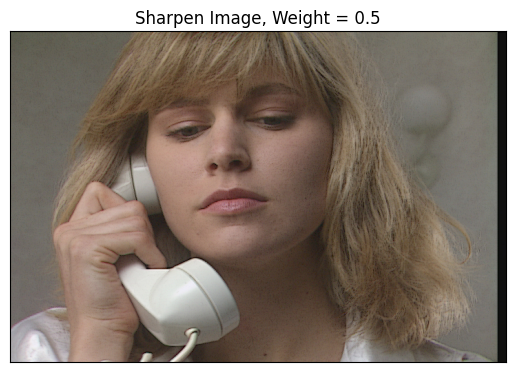

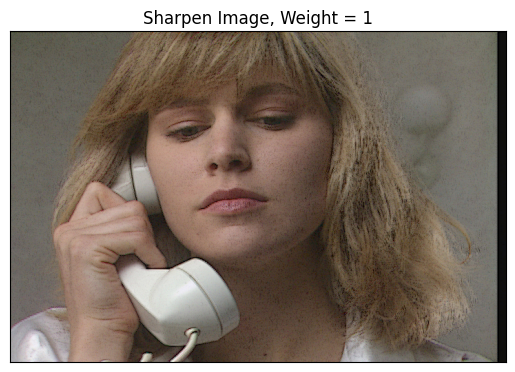

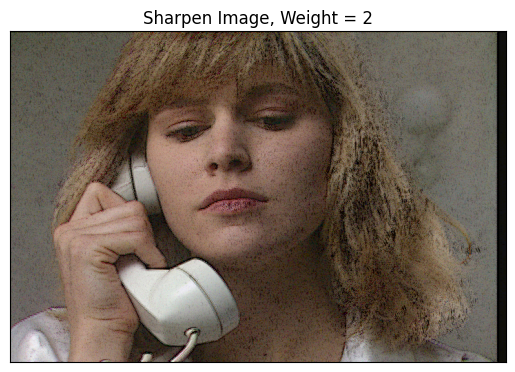

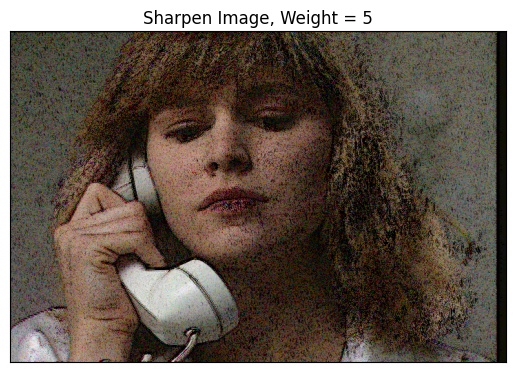

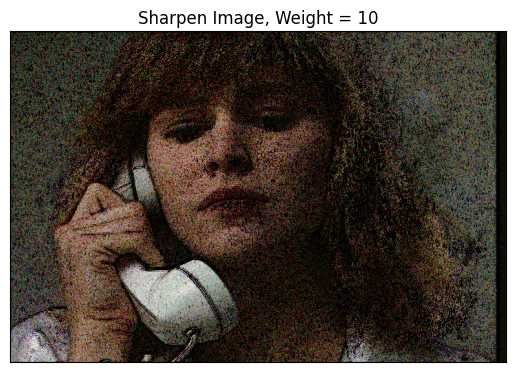

In [102]:
WEIGHTS = [0, 0.1, 0.3, 0.5, 1, 2, 5, 10]

for w in WEIGHTS:
    img_out = sharpen_image(image, w)
    plt_imshow(img_out, f"Sharpen Image, Weight = {w}")

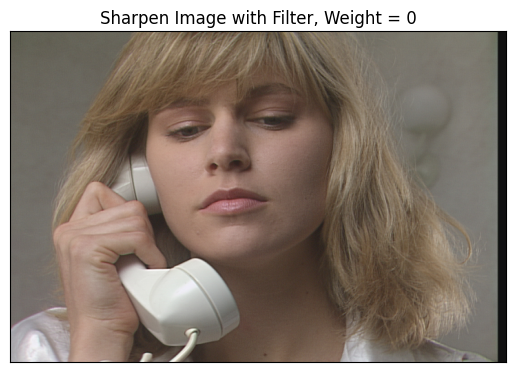

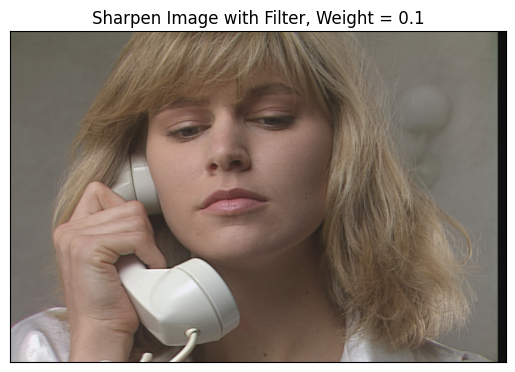

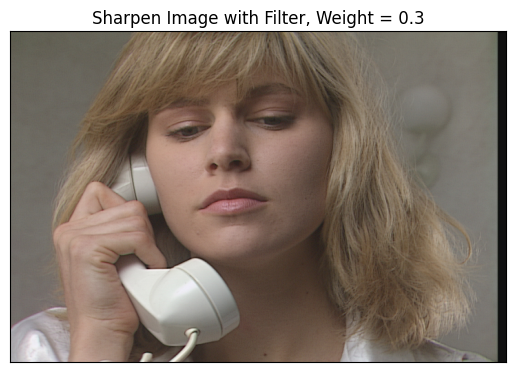

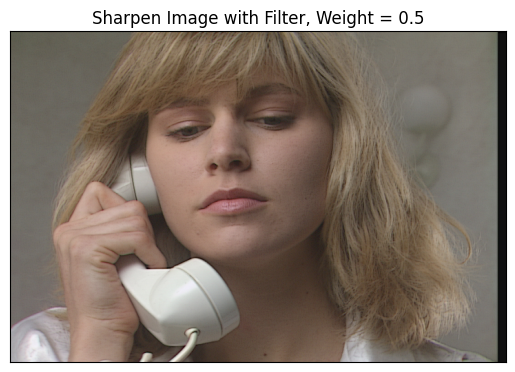

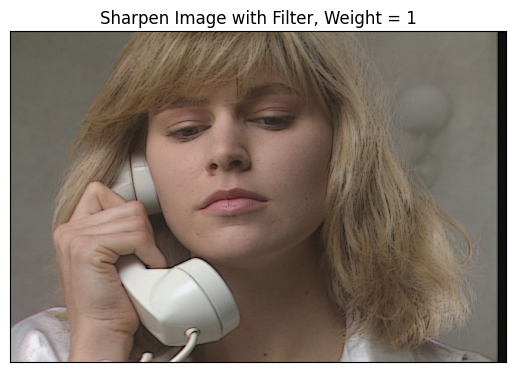

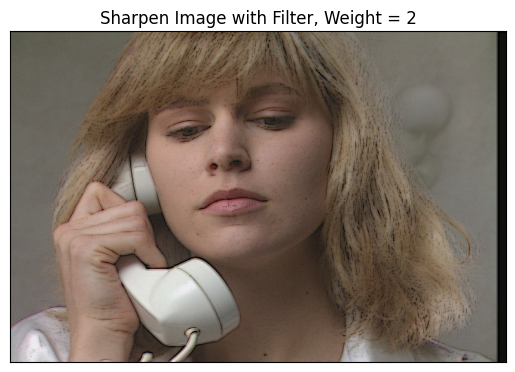

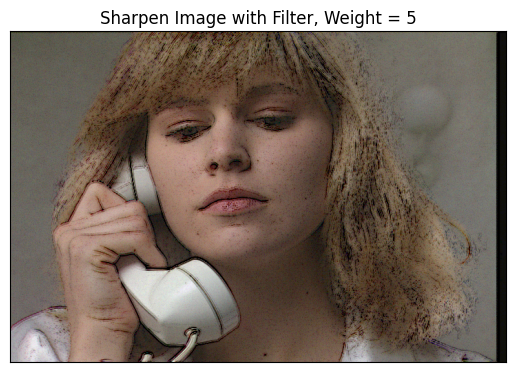

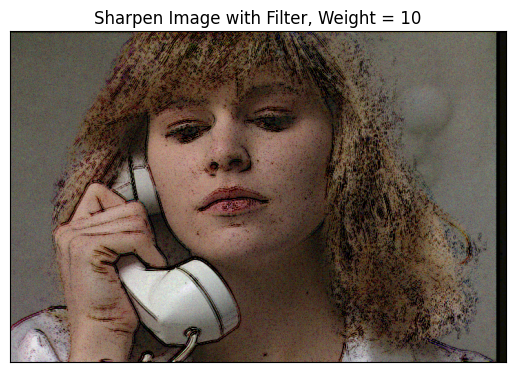

In [103]:
for w in WEIGHTS:
    img_out = sharpen_image(image, w, smoothen_image = True)
    plt_imshow(img_out, f"Sharpen Image with Filter, Weight = {w}")